<a href="https://colab.research.google.com/github/IanVlasov/NVidia_DL_in_CV/blob/lesson_8/Vlaosov_Ian_HW08.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Синтез изображений. Часть 2. Генеративно-Состязательная Сеть (GAN)


### Переключение версии TensorFlow


In [1]:
%tensorflow_version 2.x

In [2]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds

### Скачивание датасета LFM



In [3]:
lfm_ds, info = tfds.load('lfw', split='train',  
                           with_info=True)

Shuffling and writing examples to /root/tensorflow_datasets/lfw/0.1.0.incomplete6MH2SO/lfw-train.tfrecord



Dataset lfw downloaded and prepared to /root/tensorflow_datasets/lfw/0.1.0. Subsequent calls will reuse this data.


### Визуализация

In [4]:
lfm_ds.element_spec

{'image': TensorSpec(shape=(250, 250, 3), dtype=tf.uint8, name=None),
 'label': TensorSpec(shape=(), dtype=tf.string, name=None)}

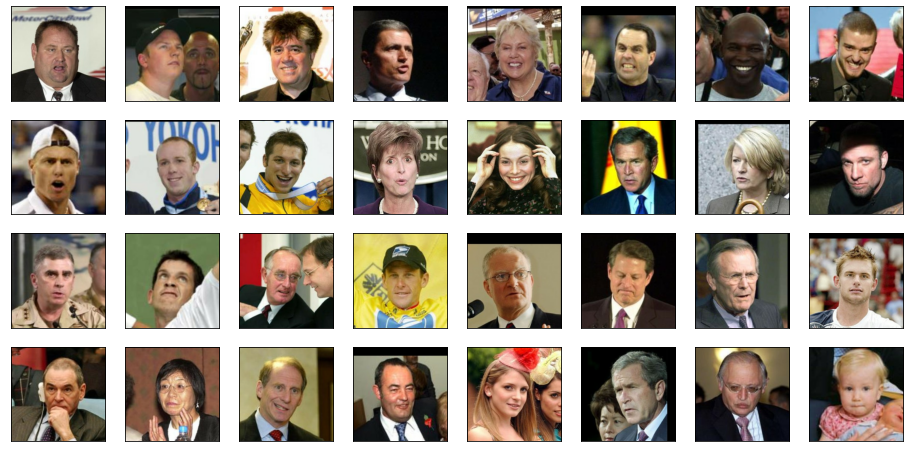

In [5]:
fig = plt.figure(figsize=(16, 8))
for j, data in enumerate(iter(lfm_ds.take(32))):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(data['image'])
    plt.xticks([]), plt.yticks([])
plt.show()

In [6]:
def prepare_image(item):
  image = item['image']
  image = (tf.image.resize(image, (64, 64)) - 127.5) / 127.5

  return image

In [7]:
train_ds = lfm_ds.map(prepare_image)

In [8]:
def plot_faces(samples):
    fig = plt.figure(figsize=(10, 10))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        ax.imshow((samples[j, ...].reshape(64, 64, 3) + 1) / 2)
        plt.xticks([]), plt.yticks([])
    plt.show()

### Создание Генератора и Дискриминатора


In [9]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(512*4*4, activation='relu'),
    tf.keras.layers.Reshape((4, 4, 512)),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(512, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(256, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(), 
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(64, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),      
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='tanh'),
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(512, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(1024, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1),
])

### Подготовка пайплайна данных и оптимизатора

Ниже будет достаточно объемный аутпут с обучения модели. Попытался поставить побольше эпох, увеличил размер инпута + сделал сети поглубже. К сожалению, колаб разорвал соединение и протестировать не получилось. На последних видимых итерациях уже различимы контуры лиц, глаза и рты. Думаю, есть много помех из-за различного фона на фотографиях, вероятно, стоило обрезать фотографии по контурам лиц, чтобы уменьшить его влияние и дать возможность сети сосредоточиться именно на генерации этих самых лиц. Сейчас она также пытается сгенерировать правдоподобный фон из-за чего страдает общее качество. 

In [10]:
INPUT_DIM = 5000
NUM_EPOCHS = 100
HALF_BATCH_SIZE = 16
BATCH_SIZE = HALF_BATCH_SIZE * 2
LEARNING_RATE = 0.0002

train_ds = train_ds.shuffle(buffer_size=13000)
train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

[Step  0] D Loss: 0.6933; G Loss: 0.5683


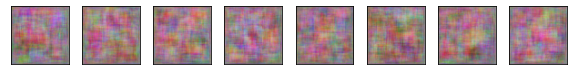

[Step 500] D Loss: 0.3069; G Loss: 2.4963


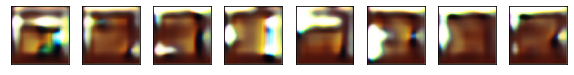

[Step 1000] D Loss: 0.1357; G Loss: 3.0802


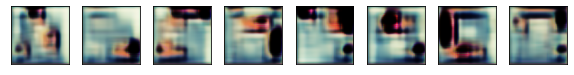

[Step 1500] D Loss: 0.3896; G Loss: 2.4363


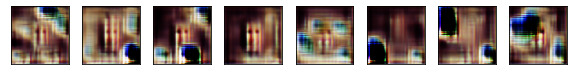

[Step 2000] D Loss: 0.0968; G Loss: 3.3254


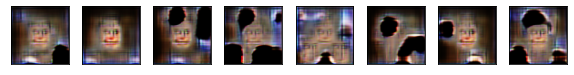

[Step 2500] D Loss: 0.2175; G Loss: 2.7455


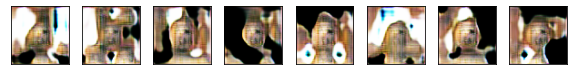

[Step 3000] D Loss: 0.0320; G Loss: 3.4840


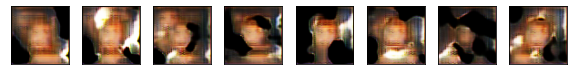

[Step 3500] D Loss: 0.2571; G Loss: 3.4913


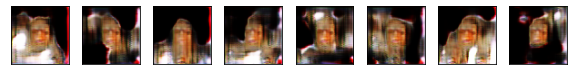

[Step 4000] D Loss: 0.0505; G Loss: 4.2475


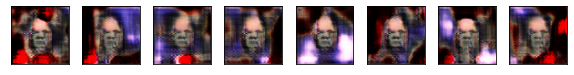

[Step 4500] D Loss: 0.2524; G Loss: 4.1101


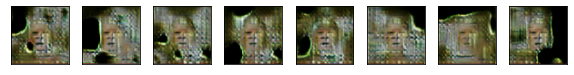

[Step 5000] D Loss: 0.3392; G Loss: 6.4590


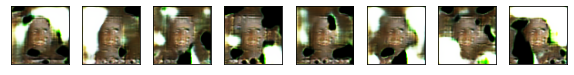

[Step 5500] D Loss: 0.0666; G Loss: 3.0882


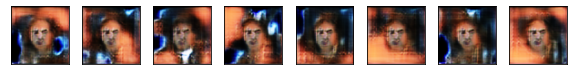

[Step 6000] D Loss: 0.1861; G Loss: 3.5819


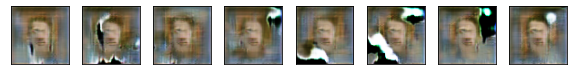

[Step 6500] D Loss: 0.0555; G Loss: 5.3084


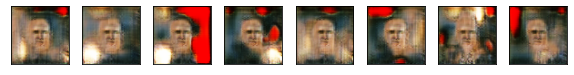

[Step 7000] D Loss: 0.1958; G Loss: 3.5902


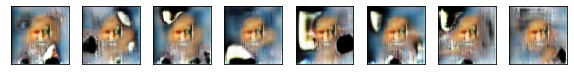

[Step 7500] D Loss: 0.0863; G Loss: 5.5476


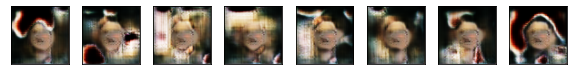

[Step 8000] D Loss: 0.5449; G Loss: 7.4905


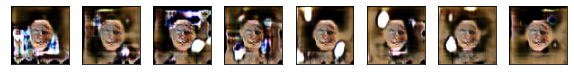

[Step 8500] D Loss: 0.0661; G Loss: 6.4349


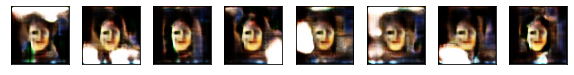

[Step 9000] D Loss: 0.0033; G Loss: 4.7775


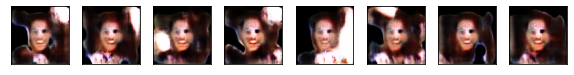

[Step 9500] D Loss: 0.2793; G Loss: 8.3248


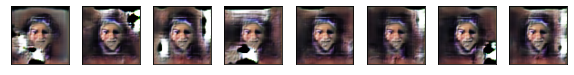

[Step 10000] D Loss: 0.1024; G Loss: 6.7450


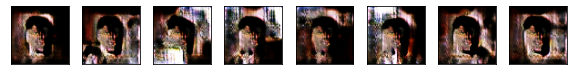

[Step 10500] D Loss: 0.1048; G Loss: 5.9498


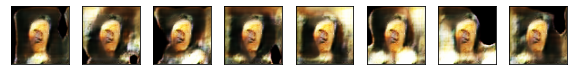

[Step 11000] D Loss: 0.0746; G Loss: 4.0880


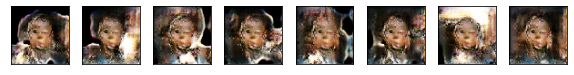

[Step 11500] D Loss: 0.0092; G Loss: 6.8946


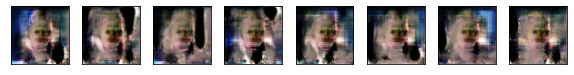

[Step 12000] D Loss: 0.0436; G Loss: 8.3879


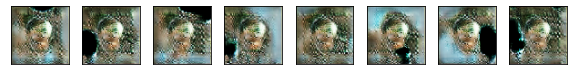

[Step 12500] D Loss: 0.1413; G Loss: 7.6274


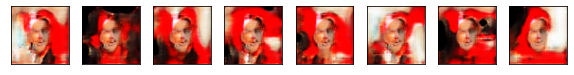

[Step 13000] D Loss: 0.0032; G Loss: 7.6175


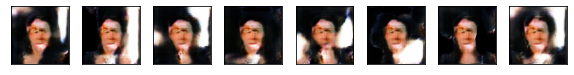

[Step 13500] D Loss: 0.0125; G Loss: 5.6328


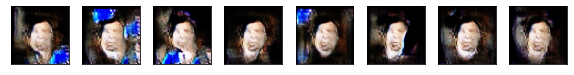

[Step 14000] D Loss: 0.0715; G Loss: 3.8676


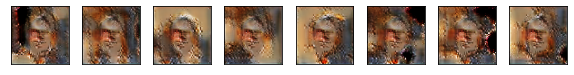

[Step 14500] D Loss: 0.1835; G Loss: 6.5745


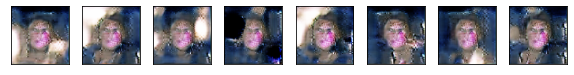

[Step 15000] D Loss: 0.0780; G Loss: 5.9388


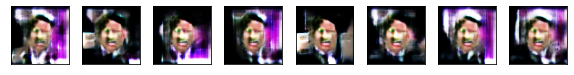

[Step 15500] D Loss: 0.0677; G Loss: 4.9392


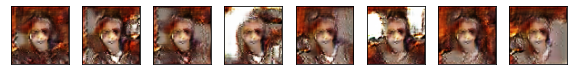

[Step 16000] D Loss: 0.0186; G Loss: 9.9652


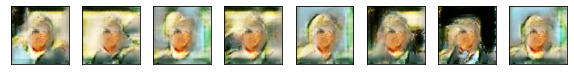

[Step 16500] D Loss: 0.0214; G Loss: 7.2909


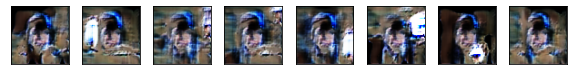

[Step 17000] D Loss: 0.0234; G Loss: 4.4547


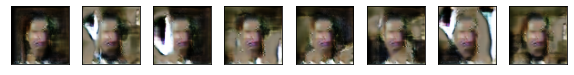

[Step 17500] D Loss: 0.0028; G Loss: 7.8235


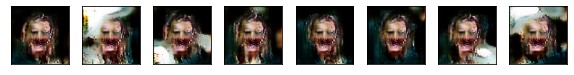

[Step 18000] D Loss: 0.2456; G Loss: 6.0939


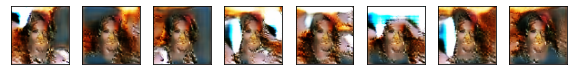

[Step 18500] D Loss: 0.0868; G Loss: 5.5506


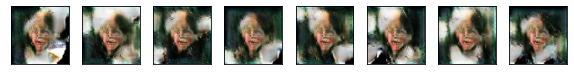

[Step 19000] D Loss: 0.1434; G Loss: 8.7384


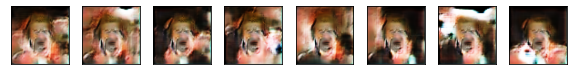

[Step 19500] D Loss: 0.0160; G Loss: 5.2915


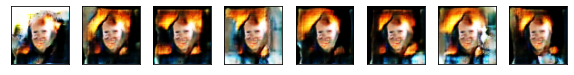

[Step 20000] D Loss: 0.2407; G Loss: 6.1818


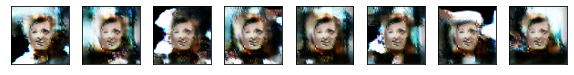

[Step 20500] D Loss: 0.0400; G Loss: 4.4478


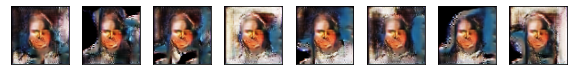

[Step 21000] D Loss: 0.1457; G Loss: 6.2081


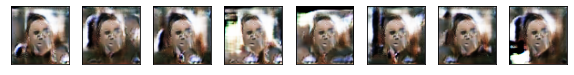

[Step 21500] D Loss: 0.1061; G Loss: 8.2550


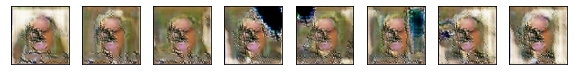

[Step 22000] D Loss: 0.0435; G Loss: 4.6787


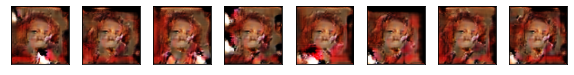

[Step 22500] D Loss: 0.0002; G Loss: 10.8844


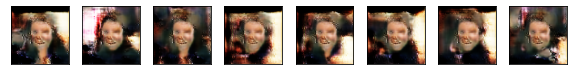

[Step 23000] D Loss: 0.0518; G Loss: 7.8210


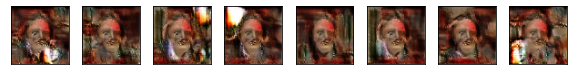

[Step 23500] D Loss: 0.2350; G Loss: 4.5561


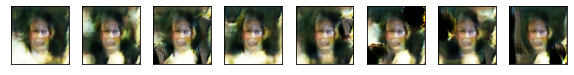

[Step 24000] D Loss: 0.0809; G Loss: 6.3597


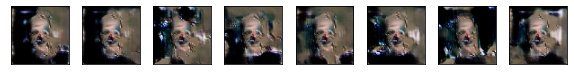

[Step 24500] D Loss: 0.1504; G Loss: 8.2298


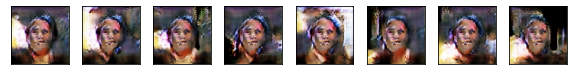

[Step 25000] D Loss: 0.0756; G Loss: 5.1688


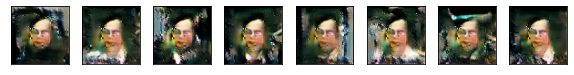

[Step 25500] D Loss: 0.1414; G Loss: 6.2281


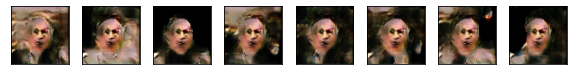

[Step 26000] D Loss: 0.0903; G Loss: 7.4437


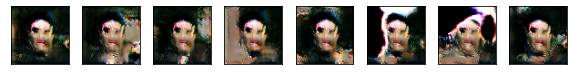

[Step 26500] D Loss: 0.0260; G Loss: 12.1731


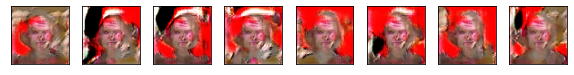

[Step 27000] D Loss: 0.0165; G Loss: 10.4341


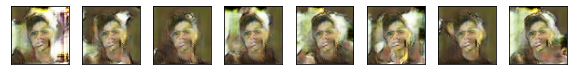

[Step 27500] D Loss: 0.0053; G Loss: 7.7601


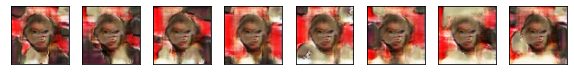

[Step 28000] D Loss: 0.0027; G Loss: 14.5388


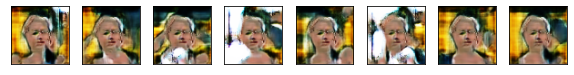

[Step 28500] D Loss: 0.0148; G Loss: 11.3106


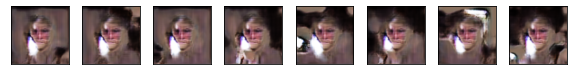

[Step 29000] D Loss: 0.0269; G Loss: 6.8790


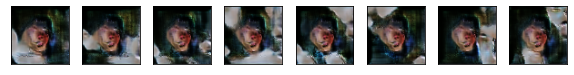

[Step 29500] D Loss: 0.0125; G Loss: 9.2616


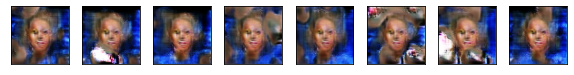

[Step 30000] D Loss: 0.1482; G Loss: 6.6254


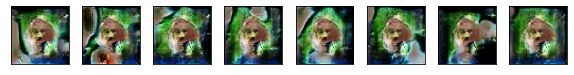

[Step 30500] D Loss: 0.1044; G Loss: 8.6824


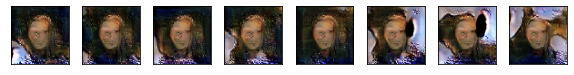

[Step 31000] D Loss: 0.0003; G Loss: 13.0084


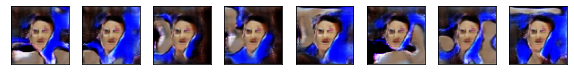

[Step 31500] D Loss: 0.0064; G Loss: 7.6871


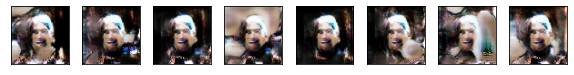

[Step 32000] D Loss: 0.0693; G Loss: 8.4674


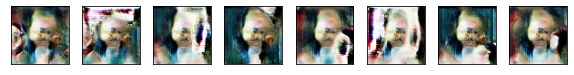

[Step 32500] D Loss: 0.0405; G Loss: 4.7357


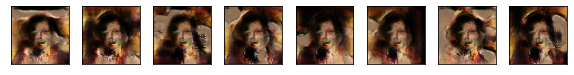

[Step 33000] D Loss: 0.0239; G Loss: 7.8613


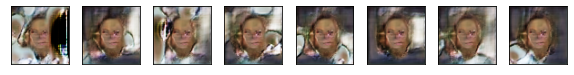

[Step 33500] D Loss: 0.0029; G Loss: 5.4874


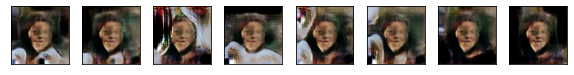

[Step 34000] D Loss: 0.0015; G Loss: 4.4742


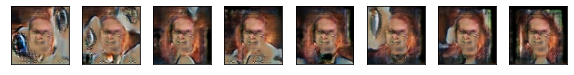

[Step 34500] D Loss: 0.0000; G Loss: 16.0410


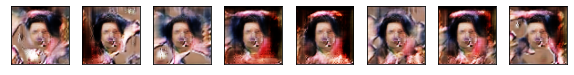

[Step 35000] D Loss: 0.0682; G Loss: 7.8265


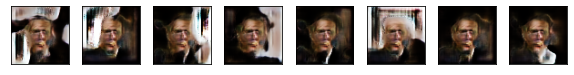

[Step 35500] D Loss: 0.0049; G Loss: 5.3246


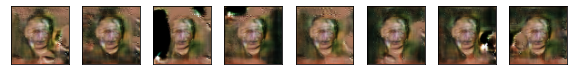

[Step 36000] D Loss: 0.0061; G Loss: 8.6469


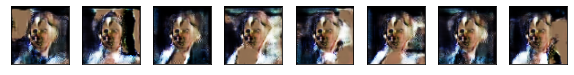

[Step 36500] D Loss: 0.0006; G Loss: 11.1088


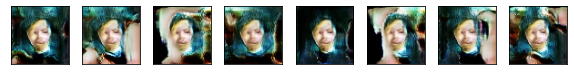

[Step 37000] D Loss: 0.0747; G Loss: 2.1220


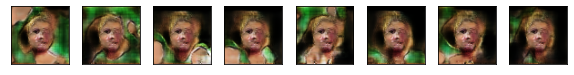

[Step 37500] D Loss: 0.0367; G Loss: 11.0209


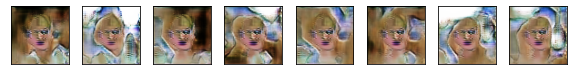

[Step 38000] D Loss: 0.0691; G Loss: 8.4371


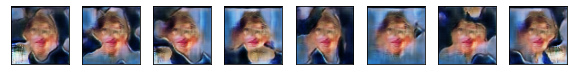

[Step 38500] D Loss: 0.0151; G Loss: 5.4641


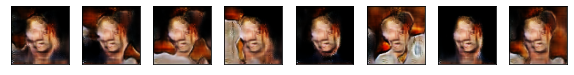

[Step 39000] D Loss: 0.0069; G Loss: 8.0693


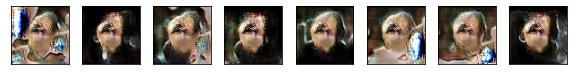

[Step 39500] D Loss: 0.0789; G Loss: 7.7308


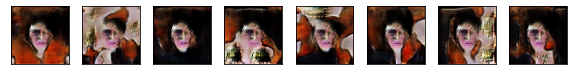

[Step 40000] D Loss: 0.0126; G Loss: 7.3646


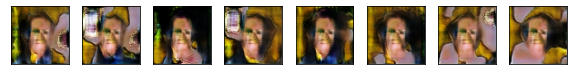

[Step 40500] D Loss: 0.1579; G Loss: 9.8455


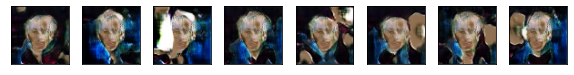

[Step 41000] D Loss: 0.0227; G Loss: 8.3388


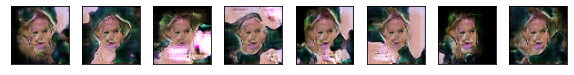

[Step 41500] D Loss: 0.1192; G Loss: 8.1296


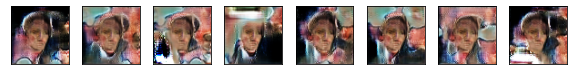

[Step 42000] D Loss: 0.2624; G Loss: 7.2085


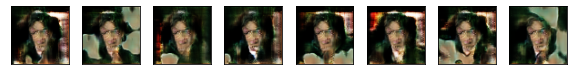

[Step 42500] D Loss: 0.0024; G Loss: 7.8720


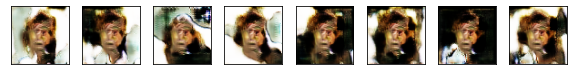

[Step 43000] D Loss: 0.0054; G Loss: 7.9291


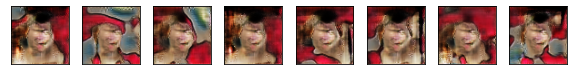

[Step 43500] D Loss: 0.1263; G Loss: 5.9527


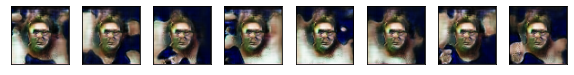

[Step 44000] D Loss: 0.0769; G Loss: 10.6974


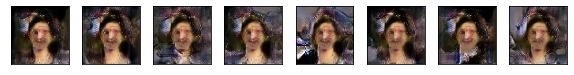

[Step 44500] D Loss: 0.0111; G Loss: 6.3172


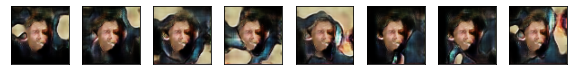

[Step 45000] D Loss: 0.2073; G Loss: 6.8618


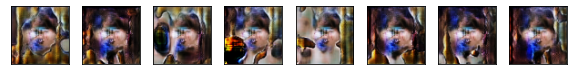

[Step 45500] D Loss: 0.0288; G Loss: 7.5616


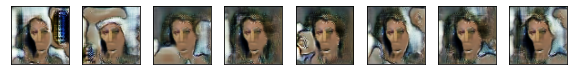

[Step 46000] D Loss: 0.0069; G Loss: 6.8179


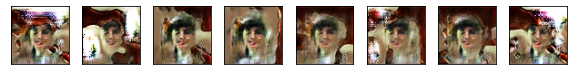

[Step 46500] D Loss: 0.0369; G Loss: 6.0461


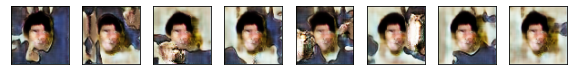

[Step 47000] D Loss: 0.1730; G Loss: 8.7357


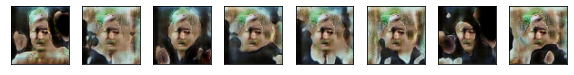

[Step 47500] D Loss: 0.1070; G Loss: 2.3721


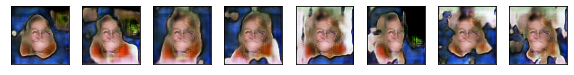

[Step 48000] D Loss: 0.0127; G Loss: 7.9841


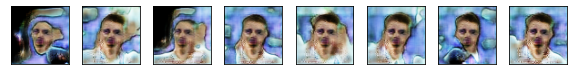

[Step 48500] D Loss: 0.0033; G Loss: 8.2948


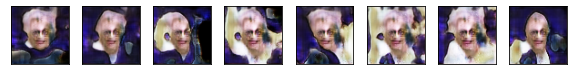

[Step 49000] D Loss: 0.1290; G Loss: 5.6066


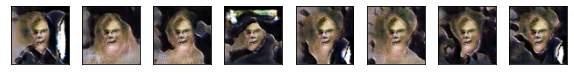

[Step 49500] D Loss: 0.3563; G Loss: 7.7921


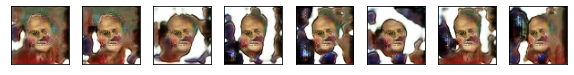

[Step 50000] D Loss: 0.0159; G Loss: 7.5979


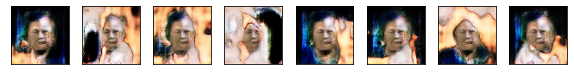

[Step 50500] D Loss: 0.0325; G Loss: 7.3016


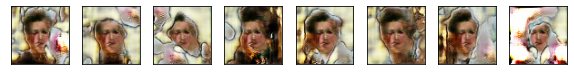

[Step 51000] D Loss: 0.1162; G Loss: 6.1282


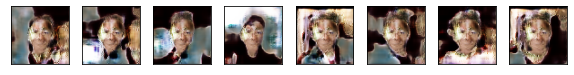

[Step 51500] D Loss: 0.0014; G Loss: 7.6212


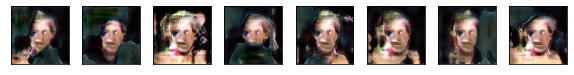

[Step 52000] D Loss: 0.0085; G Loss: 4.2045


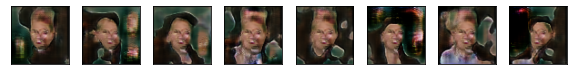

[Step 52500] D Loss: 0.0092; G Loss: 5.3829


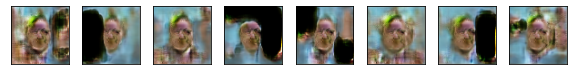

[Step 53000] D Loss: 0.3258; G Loss: 5.1090


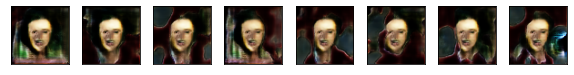

[Step 53500] D Loss: 0.0004; G Loss: 9.2841


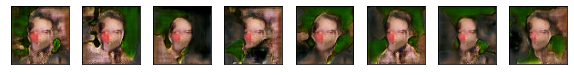

[Step 54000] D Loss: 0.0248; G Loss: 7.6790


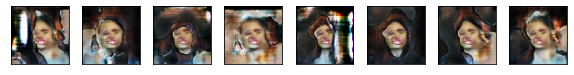

[Step 54500] D Loss: 0.0298; G Loss: 5.1116


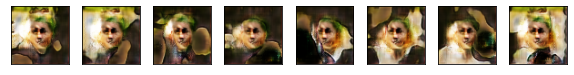

[Step 55000] D Loss: 0.1022; G Loss: 7.3626


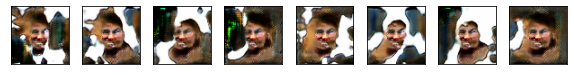

[Step 55500] D Loss: 0.0980; G Loss: 6.2381


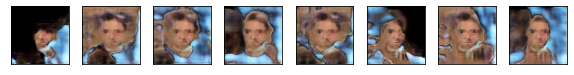

[Step 56000] D Loss: 0.0938; G Loss: 7.5630


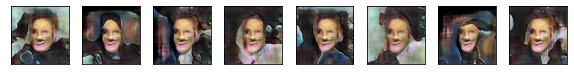

[Step 56500] D Loss: 0.0048; G Loss: 7.2933


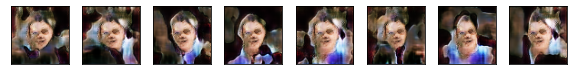

[Step 57000] D Loss: 0.0747; G Loss: 7.9022


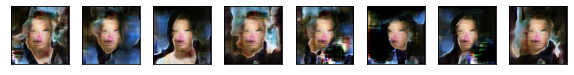

[Step 57500] D Loss: 0.1464; G Loss: 9.0002


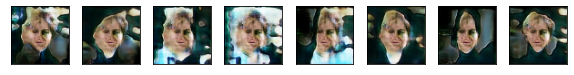

[Step 58000] D Loss: 0.1333; G Loss: 10.3885


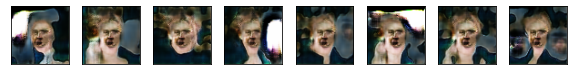

[Step 58500] D Loss: 0.0200; G Loss: 5.7952


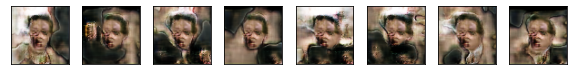

[Step 59000] D Loss: 0.0172; G Loss: 4.5789


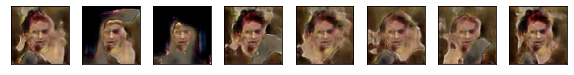

[Step 59500] D Loss: 0.0019; G Loss: 7.0091


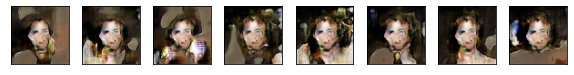

[Step 60000] D Loss: 0.0462; G Loss: 8.0198


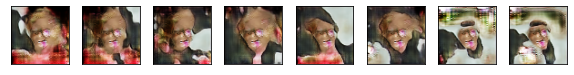

[Step 60500] D Loss: 0.0029; G Loss: 7.9335


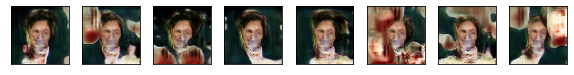

[Step 61000] D Loss: 0.0624; G Loss: 10.1920


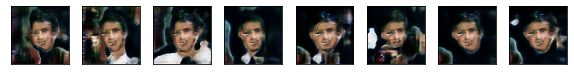

[Step 61500] D Loss: 0.2813; G Loss: 6.6065


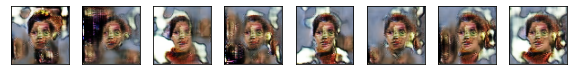

[Step 62000] D Loss: 0.0099; G Loss: 10.5901


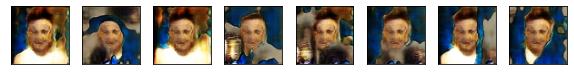

[Step 62500] D Loss: 0.0023; G Loss: 10.5101


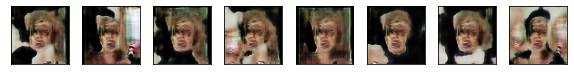

[Step 63000] D Loss: 0.0269; G Loss: 5.5949


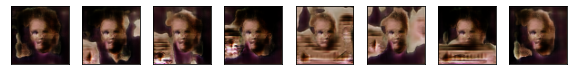

[Step 63500] D Loss: 0.0937; G Loss: 6.8943


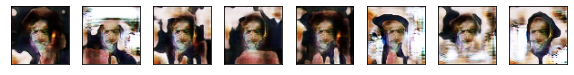

[Step 64000] D Loss: 0.0039; G Loss: 7.4383


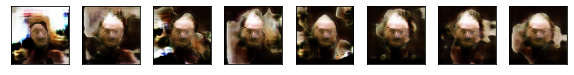

[Step 64500] D Loss: 0.0062; G Loss: 6.4759


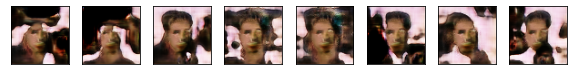

[Step 65000] D Loss: 0.0124; G Loss: 10.7227


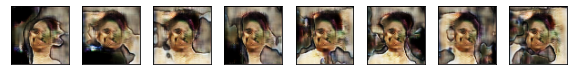

[Step 65500] D Loss: 0.0284; G Loss: 6.4528


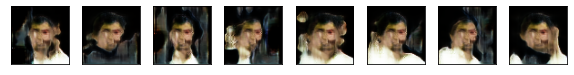

[Step 66000] D Loss: 0.0003; G Loss: 9.1684


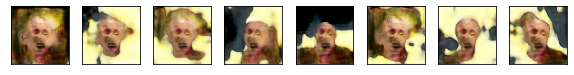

[Step 66500] D Loss: 0.3675; G Loss: 8.2020


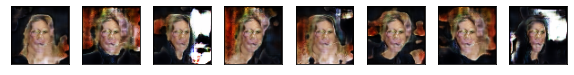

[Step 67000] D Loss: 0.0033; G Loss: 8.4015


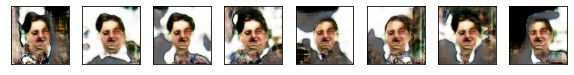

[Step 67500] D Loss: 0.1695; G Loss: 8.7021


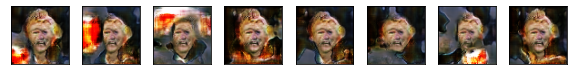

KeyboardInterrupt: ignored

In [11]:
for step, true_images in enumerate(train_ds):
    
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        logits = discriminator(generator(noise, training=True))
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 500 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        plot_faces(syntetic_images)
